# Credit Card Approval Prediction

dataset https://www.kaggle.com/datasets/rikdifos/credit-card-approval-prediction

Задача состоит в построении модели машинного обучения для оценки кредитного риска, то есть прогнозирования того, будет ли заявитель (модель будет применяться одна и к онбордингу новых и к пересчету для повышения лимита уже действующей базы)"хорошим" или "плохим" клиентом. Определение "хорошего" или "плохого" клиента не дано, и необходимо использовать техники, такие как анализ винтажа, для создания меток. В этой задаче также стоит столкнуться с проблемой несбалансированных данных. Обратить внимани, что более сложные методы машинного обучения могут быть менее прозрачными, что затрудняет объяснение принятого решения клиенту и регуляторам.

In [1]:
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import pandas_profiling
import numpy as np

In [2]:
import matplotlib.pyplot as plt
plt.rcParams['figure.figsize'] = (7,5)
import seaborn as sns
sns.set(rc={'figure.figsize':(7,5)})
from mpl_toolkits import mplot3d
import matplotlib
import time

In [3]:
# вывод всех резалтов, а не только последнего
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [4]:
import datetime

In [5]:
from sklearn.model_selection import train_test_split

from imblearn.over_sampling import SMOTE
import itertools

from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier

from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier


from sklearn.metrics import mean_squared_error, mean_absolute_error, make_scorer, accuracy_score, confusion_matrix, balanced_accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report

from sklearn.decomposition import PCA


# EDA

In [6]:
df_application   = pd.read_csv("application_record.csv", encoding = 'utf-8') 
df_credit = pd.read_csv("credit_record.csv", encoding = 'utf-8') 

print("Shape of application data",df_application.shape) #(438557, 18)
print("-------------------------------------------")
print("Shape of credit data",df_credit.shape) #(1048575, 3)

Shape of application data (438557, 18)
-------------------------------------------
Shape of credit data (1048575, 3)


application_record.csv

| Feature name        | Explanation                                           | Remarks                                                                                                                |
|---------------------|-------------------------------------------------------|------------------------------------------------------------------------------------------------------------------------|
| ID                  | Client number                                         |                                                                                                                        |
| CODE_GENDER         | Gender                                                |                                                                                                                        |
| FLAG_OWN_CAR        | Is there a car                                        |                                                                                                                        |
| FLAG_OWN_REALTY     | Is there a property                                   |                                                                                                                        |
| CNT_CHILDREN        | Number of children                                    |                                                                                                                        |
| AMT_INCOME_TOTAL    | Annual income                                         |                                                                                                                        |
| NAME_INCOME_TYPE    | Income category                                       |                                                                                                                        |
| NAME_EDUCATION_TYPE | Education level                                       |                                                                                                                        |
| NAME_FAMILY_STATUS  | Marital status                                        |                                                                                                                        |
| NAME_HOUSING_TYPE   | Way of living                                         |                                                                                                                        |
| DAYS_BIRTH          | Birthday                                              | Count backwards from current day (0), -1 means yesterday                                                               |
| DAYS_EMPLOYED       | Start date of employment                              | Count backwards from current day(0). If positive, it means the person currently unemployed.                            |
| FLAG_MOBIL          | Is there a mobile phone                               |                                                                                                                        |
| FLAG_WORK_PHONE     | Is there a work phone                                  |                                                                                                                        |
| FLAG_PHONE          | Is there a phone                                      |                                                                                                                        |
| FLAG_EMAIL          | Is there an email                                     |                                                                                                                        |
| OCCUPATION_TYPE     | Occupation                                            |                                                                                                                        |
| CNT_FAM_MEMBERS     | Family size                                           |                                                                                                                        |


In [7]:
pandas_profiling.ProfileReport(df_application)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

credit_record.csv	

| Feature name    | Explanation                                     | Remarks                                                                                                                                        |
|-----------------|-------------------------------------------------|------------------------------------------------------------------------------------------------------------------------------------------------|
| ID              | Client number                                   |                                                                                                                                                |
| MONTHS_BALANCE  | Record month                                    | The month of the extracted data is the starting point, backwards, 0 is the current month, -1 is the previous month, and so on                  |
| STATUS          | Status                                          | 0: 1-29 days past due 1: 30-59 days past due 2: 60-89 days overdue 3: 90-119 days overdue 4: 120-149 days overdue 5: Overdue or bad debts, write-offs for more than 150 days C: paid off that month X: No loan for the month |


In [8]:
pandas_profiling.ProfileReport(df_credit)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [9]:
print("data type of application data",df_application.dtypes)
print("-------------------------------------------")
print("data type of credit data",df_credit.dtypes)

data type of application data ID                       int64
CODE_GENDER             object
FLAG_OWN_CAR            object
FLAG_OWN_REALTY         object
CNT_CHILDREN             int64
AMT_INCOME_TOTAL       float64
NAME_INCOME_TYPE        object
NAME_EDUCATION_TYPE     object
NAME_FAMILY_STATUS      object
NAME_HOUSING_TYPE       object
DAYS_BIRTH               int64
DAYS_EMPLOYED            int64
FLAG_MOBIL               int64
FLAG_WORK_PHONE          int64
FLAG_PHONE               int64
FLAG_EMAIL               int64
OCCUPATION_TYPE         object
CNT_FAM_MEMBERS        float64
dtype: object
-------------------------------------------
data type of credit data ID                 int64
MONTHS_BALANCE     int64
STATUS            object
dtype: object


In [10]:
print("columns in application data")
print("--------------------------------------------------------------------------------")
cat_app_data = [i for i in df_application.select_dtypes(include=np.object).columns]
num_app_data = [i for i in df_application.select_dtypes(include=np.number).columns]
print("categorical columns in application data",cat_app_data)
print("--------------------------------------------------------------------------------")
print("numerical columns in application data",num_app_data)

columns in application data
--------------------------------------------------------------------------------
categorical columns in application data ['CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE']
--------------------------------------------------------------------------------
numerical columns in application data ['ID', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS']


In [11]:
# find all users' account open month.
begin_month=pd.DataFrame(df_credit.groupby(["ID"])["MONTHS_BALANCE"].agg(min))
begin_month=begin_month.rename(columns={'MONTHS_BALANCE':'begin_month'}) 

new_data=pd.merge(df_application,begin_month,how="left",on="ID") #merge to record data
new_data.shape #(438557, 19)

(438557, 19)

In [12]:
new_data['ID'].isna().sum()

0

In [13]:
new_data.head()

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,begin_month
0,5008804,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-15.0
1,5008805,M,Y,Y,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,-12005,-4542,1,1,0,0,NaN,2.0,-14.0
2,5008806,M,Y,Y,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,-21474,-1134,1,0,0,0,Security staff,2.0,-29.0
3,5008808,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,-4.0
4,5008809,F,N,Y,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-19110,-3051,1,0,1,1,Sales staff,1.0,-26.0


In [14]:
# Filter out the rows with "X" or "C" status, and keep only the ID, start month, and status columns
credit_start_status = df_credit.loc[df_credit['STATUS'].isin(['0', '1', '2', '3', '4', '5']), ['ID', 'MONTHS_BALANCE', 'STATUS']]
credit_start_status1 = credit_start_status.loc[(df_credit['STATUS'] !='X') & (df_credit['STATUS'] !='C') ,:]
credit_start_status1['status'] = credit_start_status1['STATUS']

# Keep only the rows where the start month is within 3 months of the beginning of the dataset
credit_start_status1 = credit_start_status1.loc[credit_start_status1['MONTHS_BALANCE'] >= -18, ['ID', 'MONTHS_BALANCE', 'status']]
credit_start_status1 = credit_start_status1.loc[credit_start_status1['MONTHS_BALANCE'] <= 0, ['ID', 'MONTHS_BALANCE', 'status']]
credit_start_status1['start_month'] = -credit_start_status1['MONTHS_BALANCE']

# Merge the credit_start_status1 and new_data dataframes on the ID column
merged_data = pd.merge(new_data, credit_start_status1, on='ID', how='inner')

# Group the merged data by start month and status, and count the number of occurrences
grouped_data = merged_data.groupby(['start_month', 'status'])['ID'].count()
grouped_data = grouped_data.unstack()

# Divide each row by the sum of the row to get the roll rate
roll_rate = grouped_data.div(grouped_data.sum(axis=1), axis=0)

# Plot the roll rate
roll_rate.plot(kind='bar', stacked=True, figsize=(12, 8))
plt.title('Roll Rate by Status and Month Since Opened')
plt.xlabel('Months Since Opened')
plt.ylabel('Roll Rate')
plt.show()


<AxesSubplot: xlabel='start_month'>

Text(0.5, 1.0, 'Roll Rate by Status and Month Since Opened')

Text(0.5, 0, 'Months Since Opened')

Text(0, 0.5, 'Roll Rate')

In [15]:
round(roll_rate*100.0,2)

status,0,1,2,3,4,5
start_month,,,,,,
0,95.49,3.27,0.26,0.08,0.07,0.82
1,95.49,3.36,0.21,0.08,0.14,0.72
2,95.55,3.40,0.24,0.14,0.04,0.65
3,96.20,2.68,0.37,0.07,0.06,0.61
4,95.18,3.80,0.24,0.06,0.10,0.62
5,95.92,3.01,0.22,0.11,0.11,0.62
6,95.81,3.18,0.24,0.09,0.10,0.57
7,96.02,3.08,0.19,0.12,0.08,0.52
8,96.05,2.98,0.32,0.09,0.05,0.50


In [16]:
df_credit.head()

,ID,MONTHS_BALANCE,STATUS
0,5001711,0,X
1,5001711,-1,0
2,5001711,-2,0
3,5001711,-3,0
4,5001712,0,C


In [17]:
new_data.shape
new_data['ID'].nunique()


(438557, 19)

438510

In [18]:
duplicates_mask = new_data['ID'].duplicated(keep=False)
duplicates = new_data[duplicates_mask].sort_values('ID')
duplicates

,ID,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,DAYS_BIRTH,DAYS_EMPLOYED,FLAG_MOBIL,FLAG_WORK_PHONE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,begin_month
426818,7022197,M,Y,Y,3,135000.0,Working,Secondary / secondary special,Married,House / apartment,-11945,-735,1,0,0,1,Laborers,5.0,NaN
425023,7022197,F,N,Y,0,450000.0,Commercial associate,Higher education,Separated,House / apartment,-19813,-1799,1,0,0,1,NaN,1.0,NaN
431545,7022327,F,N,Y,0,135000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,-14771,-5298,1,0,0,0,High skill tech staff,1.0,NaN
431911,7022327,M,Y,Y,0,256500.0,Commercial associate,Higher education,Married,House / apartment,-21503,-1674,1,0,0,1,Core staff,2.0,NaN
425486,7023108,M,Y,Y,1,67500.0,Working,Secondary / secondary special,Married,House / apartment,-15156,-1696,1,1,0,0,Core staff,3.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
426563,7836711,F,N,Y,2,292500.0,Working,Higher education,Married,House / apartment,-13747,-4386,1,0,1,0,Accountants,4.0,NaN
421464,7836971,M,Y,N,1,157500.0,Working,Secondary / secondary special,Married,House / apartment,-13771,-5520,1,0,0,0,NaN,3.0,NaN
428620,7836971,F,N,Y,0,103500.0,Working,Secondary / secondary special,Civil marriage,House / apartment,-13383,-2798,1,0,1,0,Sales staff,2.0,NaN
422068,7838075,M,N,Y,0,337500.0,Commercial associate,Secondary / secondary special,Married,House / apartment,-18198,-1275,1,0,0,1,Drivers,2.0,NaN


In [19]:
#Для этих 94 записей у нас очень протеворечивы анкетные данные, удалим их с нашего набора
duplicates_mask = new_data['ID'].duplicated(keep=False)
new_data = new_data[~duplicates_mask]

In [20]:
new_data.shape
new_data['ID'].nunique()

(438463, 19)

438463

In [21]:
df_credit.shape
df_credit['ID'].nunique() #45 985

(1048575, 3)

45985

In [22]:
df_credit['ID'].isna().sum()

0

In [23]:
df_credit['ID'].nunique()/new_data['ID'].nunique()

0.10487772058303665

In [24]:
new_data['ID'].agg(['min', 'max', 'mean'])

min     5.008804e+06
max     7.999952e+06
mean    6.021894e+06
Name: ID, dtype: float64

In [25]:
df_credit['ID'].agg(['min', 'max', 'mean'])

min     5.001711e+06
max     5.150487e+06
mean    5.068286e+06
Name: ID, dtype: float64

In [26]:
#данные о счетах не позднее чем по айди 5150487

Отмечу, что среди всех уникальных заявителей (438463) только (45985) по 9.3% у нас есть открытые счета и данные о его активности.
Попробуем построить модель оценки от заявки, а не открытия счета, так как мы заранее не знаем на моменте заявочной оценки откроет ли клиент счет.
Так как по тем клиентам кому отказали в открытии счета или же после одобрения они сами не открыли счет мы не можем объективно сказать что они не проблемные, то для них беру отдельный класс - 1

хорошие будут - 0
без счета - 1
проблемные 2

при этом данные о счетах у нас есть не позднее чем по айди 5150487
наблюдения позднее удалю, похоже на упущенные данные

In [27]:
new_data.shape
new_data['ID'].nunique()

(438463, 19)

438463

In [28]:
new_data = new_data.drop(new_data[new_data['ID'] > 5150487].index)

In [29]:
new_data.shape
new_data['ID'].nunique()

(36457, 19)

36457

In [30]:
new_data['ID'].agg(['min', 'max', 'mean'])

min     5.008804e+06
max     5.150487e+06
mean    5.078227e+06
Name: ID, dtype: float64

In [31]:
# I choose users who overdue for more than 60 days as target risk users. Those samples are marked as '1', else are '0'.
df_credit['dep_value'] = None
df_credit['dep_value'][df_credit['STATUS'] =='2']='Yes' 
df_credit['dep_value'][df_credit['STATUS'] =='3']='Yes' 
df_credit['dep_value'][df_credit['STATUS'] =='4']='Yes' 
df_credit['dep_value'][df_credit['STATUS'] =='5']='Yes' 

In [32]:
cpunt=df_credit.groupby('ID').count()
cpunt['dep_value'][cpunt['dep_value'] > 0]='Yes' 
cpunt['dep_value'][cpunt['dep_value'] == 0]='No' 
cpunt = cpunt[['dep_value']]

In [33]:
cpunt.shape#45 985


(45985, 1)

In [34]:
cpunt.columns

Index(['dep_value'], dtype='object')

In [35]:
cpunt = cpunt.reset_index()


In [36]:
cpunt.head()

,ID,dep_value
0,5001711,No
1,5001712,No
2,5001713,No
3,5001714,No
4,5001715,No


In [37]:
cpunt['ID'].nunique() #45 985

45985

In [38]:
new_data.shape
new_data['ID'].nunique()

(36457, 19)

36457

In [39]:
new_data['ID'].isna().sum()

0

In [40]:
new_data = pd.merge(new_data, cpunt, how='left', on='ID')

In [41]:
new_data['ID'].isna().sum()

0

In [42]:
new_data.shape
new_data['ID'].nunique()

(36457, 20)

36457

In [43]:
new_data['target']=new_data['dep_value']
new_data.loc[new_data['target']=='Yes','target']=2
new_data.loc[new_data['target']=='No','target']=0
new_data['target'] = new_data['target'].fillna(1)

In [44]:
print(cpunt['dep_value'].value_counts())
cpunt['dep_value'].value_counts(normalize=True)

No     45318
Yes      667
Name: dep_value, dtype: int64


No     0.985495
Yes    0.014505
Name: dep_value, dtype: float64

In [45]:
print(new_data['target'].value_counts())
new_data['target'].value_counts(normalize=True)

0    35841
2      616
Name: target, dtype: int64


0    0.983103
2    0.016897
Name: target, dtype: float64

Нет данных когда просто не открыли счет, заменю 2 на 1

In [46]:
new_data.loc[new_data['target']==2,'target']=1

In [47]:
667 - 616

51

Есть небольшая проблема с данными. Мы имеем дело с несбалансированным целевым классом, как видно из графика выше. Что имеет логичный характер при оценке проблемности клиента банка.

OCCUPATION_TYPE has 134203 (30.6%) missing values - если просто удалить все данные с пропусками мы потерям много наблюдений

51 кейс проблемных потеряли в виду отсутствия заявочных данных

In [48]:
new_data.rename(columns={'CODE_GENDER':'Gender','FLAG_OWN_CAR':'Car','FLAG_OWN_REALTY':'Reality',
                         'CNT_CHILDREN':'ChldNo','AMT_INCOME_TOTAL':'inc',
                         'NAME_EDUCATION_TYPE':'edutp','NAME_FAMILY_STATUS':'famtp',
                        'NAME_HOUSING_TYPE':'houtp','FLAG_EMAIL':'email',
                         'NAME_INCOME_TYPE':'inctp','FLAG_WORK_PHONE':'wkphone',
                         'FLAG_PHONE':'phone','CNT_FAM_MEMBERS':'famsize',
                        'OCCUPATION_TYPE':'occyp'
                        },inplace=True)

In [49]:
new_data.shape

(36457, 21)

In [50]:
new_data['occyp'].value_counts(dropna=False)

NaN                      11323
Laborers                  6211
Core staff                3591
Sales staff               3485
Managers                  3012
Drivers                   2138
High skill tech staff     1383
Accountants               1241
Medicine staff            1207
Cooking staff              655
Security staff             592
Cleaning staff             551
Private service staff      344
Low-skill Laborers         175
Waiters/barmen staff       174
Secretaries                151
HR staff                    85
Realty agents               79
IT staff                    60
Name: occyp, dtype: int64

In [51]:
new_data.loc[(new_data['occyp']=='Cleaning staff') | (new_data['occyp']=='Cooking staff') | (new_data['occyp']=='Drivers') | (new_data['occyp']=='Laborers') | (new_data['occyp']=='Low-skill Laborers') | (new_data['occyp']=='Security staff') | (new_data['occyp']=='Waiters/barmen staff'),'occyp']='Laborwk'
new_data.loc[(new_data['occyp']=='Accountants') | (new_data['occyp']=='Core staff') | (new_data['occyp']=='HR staff') | (new_data['occyp']=='Medicine staff') | (new_data['occyp']=='Private service staff') | (new_data['occyp']=='Realty agents') | (new_data['occyp']=='Sales staff') | (new_data['occyp']=='Secretaries'),'occyp']='officewk'
new_data.loc[(new_data['occyp']=='Managers') | (new_data['occyp']=='High skill tech staff') | (new_data['occyp']=='IT staff'),'occyp']='hightecwk'

In [52]:
new_data['occyp'].value_counts(dropna=False)

NaN          11323
Laborwk      10496
officewk     10183
hightecwk     4455
Name: occyp, dtype: int64

In [53]:
new_data.loc[new_data['occyp'].isna(), 'occyp'] = 'Unknown'

In [54]:
pred_list = ['Gender', 'Car', 'Reality', 'phone', 'email', 'wkphone']

for pred in pred_list:
    if pred == 'Gender':
        new_data[pred] = new_data[pred].replace(['F','M'],[0,1])
    elif pred in ['Car', 'Reality']:
        new_data[pred] = new_data[pred].replace(['N','Y'],[0,1])
    elif pred == 'phone':
        new_data[pred] = new_data[pred].astype(str)
        new_data.drop(new_data[new_data[pred] == 'nan' ].index, inplace=True)
    elif pred == 'email':
        new_data[pred] = new_data[pred].astype(str)

In [55]:
new_data.head()

,ID,Gender,Car,Reality,ChldNo,inc,inctp,edutp,famtp,houtp,...,DAYS_EMPLOYED,FLAG_MOBIL,wkphone,phone,email,occyp,famsize,begin_month,dep_value,target
0,5008804,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,Unknown,2.0,-15.0,No,0
1,5008805,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,-4542,1,1,0,0,Unknown,2.0,-14.0,No,0
2,5008806,1,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,-1134,1,0,0,0,Laborwk,2.0,-29.0,No,0
3,5008808,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,officewk,1.0,-4.0,No,0
4,5008809,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,-3051,1,0,1,1,officewk,1.0,-26.0,No,0


In [56]:
new_data.shape

(36457, 21)

In [57]:
new_data = new_data.drop('dep_value', axis=1)

In [58]:
new_data.shape

(36457, 20)

In [59]:
new_data['ChldNo'].plot(kind='hist',bins=20,density=True)

<AxesSubplot: title={'center': 'Roll Rate by Status and Month Since Opened'}, xlabel='Months Since Opened', ylabel='Frequency'>

In [60]:
new_data.loc[new_data['ChldNo'] >= 2,'ChldNo']='2More'

In [61]:
new_data['Age']=-(new_data['DAYS_BIRTH'])//365
new_data['Age'].plot(kind='hist',bins=20,density=True)




<AxesSubplot: title={'center': 'Roll Rate by Status and Month Since Opened'}, xlabel='Months Since Opened', ylabel='Frequency'>

In [62]:
new_data['worktm']=-(new_data['DAYS_EMPLOYED'])//365
new_data['worktm'].plot(kind='hist',bins=20,density=True)

<AxesSubplot: title={'center': 'Roll Rate by Status and Month Since Opened'}, xlabel='Months Since Opened', ylabel='Frequency'>

In [63]:
new_data.loc[new_data['edutp']=='Academic degree','edutp']='Higher education'

In [64]:
new_data.head()

,ID,Gender,Car,Reality,ChldNo,inc,inctp,edutp,famtp,houtp,...,FLAG_MOBIL,wkphone,phone,email,occyp,famsize,begin_month,target,Age,worktm
0,5008804,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,1,0,0,Unknown,2.0,-15.0,0,32,12
1,5008805,1,1,1,0,427500.0,Working,Higher education,Civil marriage,Rented apartment,...,1,1,0,0,Unknown,2.0,-14.0,0,32,12
2,5008806,1,1,1,0,112500.0,Working,Secondary / secondary special,Married,House / apartment,...,1,0,0,0,Laborwk,2.0,-29.0,0,58,3
3,5008808,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,0,1,1,officewk,1.0,-4.0,0,52,8
4,5008809,0,0,1,0,270000.0,Commercial associate,Secondary / secondary special,Single / not married,House / apartment,...,1,0,1,1,officewk,1.0,-26.0,0,52,8


In [65]:
new_data = new_data.drop('DAYS_BIRTH', axis=1)
new_data = new_data.drop('DAYS_EMPLOYED', axis=1)

In [66]:
new_data['ID'].isna().sum()

0

In [67]:
new_data.loc[new_data['ID'].isna()]

,ID,Gender,Car,Reality,ChldNo,inc,inctp,edutp,famtp,houtp,FLAG_MOBIL,wkphone,phone,email,occyp,famsize,begin_month,target,Age,worktm


In [68]:
pandas_profiling.ProfileReport(new_data)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [69]:
def convert_dummy(df, feature,rank=0):
    pos = pd.get_dummies(df[feature], prefix=feature)
    mode = df[feature].value_counts().index[rank]
    biggest = feature + '_' + str(mode)
    pos.drop([biggest],axis=1,inplace=True)
    df.drop([feature],axis=1,inplace=True)
    df=df.join(pos)
    return df

In [70]:
new_data = convert_dummy(new_data,'ChldNo')
new_data = convert_dummy(new_data,'edutp')
new_data = convert_dummy(new_data,'famtp')
new_data = convert_dummy(new_data,'occyp')
new_data = convert_dummy(new_data,'houtp')
new_data = convert_dummy(new_data,'inctp')

In [71]:
new_data.head()

,ID,Gender,Car,Reality,inc,FLAG_MOBIL,wkphone,phone,email,famsize,...,occyp_officewk,houtp_Co-op apartment,houtp_Municipal apartment,houtp_Office apartment,houtp_Rented apartment,houtp_With parents,inctp_Commercial associate,inctp_Pensioner,inctp_State servant,inctp_Student
0,5008804,1,1,1,427500.0,1,1,0,0,2.0,...,0,0,0,0,1,0,0,0,0,0
1,5008805,1,1,1,427500.0,1,1,0,0,2.0,...,0,0,0,0,1,0,0,0,0,0
2,5008806,1,1,1,112500.0,1,0,0,0,2.0,...,0,0,0,0,0,0,0,0,0,0
3,5008808,0,0,1,270000.0,1,0,1,1,1.0,...,1,0,0,0,0,0,1,0,0,0
4,5008809,0,0,1,270000.0,1,0,1,1,1.0,...,1,0,0,0,0,0,1,0,0,0


In [72]:
print("columns in new_data  ")
print("--------------------------------------------------------------------------------")
cat_app_data = [i for i in new_data.select_dtypes(include=np.object).columns]
num_app_data = [i for i in new_data.select_dtypes(include=np.number).columns]
print("categorical columns in new_data  ",cat_app_data)
print("--------------------------------------------------------------------------------")
print("numerical columns in new_data  ",num_app_data)

columns in new_data  
--------------------------------------------------------------------------------
categorical columns in new_data   ['phone', 'email']
--------------------------------------------------------------------------------
numerical columns in new_data   ['ID', 'Gender', 'Car', 'Reality', 'inc', 'FLAG_MOBIL', 'wkphone', 'famsize', 'begin_month', 'target', 'Age', 'worktm', 'ChldNo_1', 'ChldNo_2More', 'edutp_Higher education', 'edutp_Incomplete higher', 'edutp_Lower secondary', 'famtp_Civil marriage', 'famtp_Separated', 'famtp_Single / not married', 'famtp_Widow', 'occyp_Laborwk', 'occyp_hightecwk', 'occyp_officewk', 'houtp_Co-op apartment', 'houtp_Municipal apartment', 'houtp_Office apartment', 'houtp_Rented apartment', 'houtp_With parents', 'inctp_Commercial associate', 'inctp_Pensioner', 'inctp_State servant', 'inctp_Student']


In [73]:
%matplotlib inline

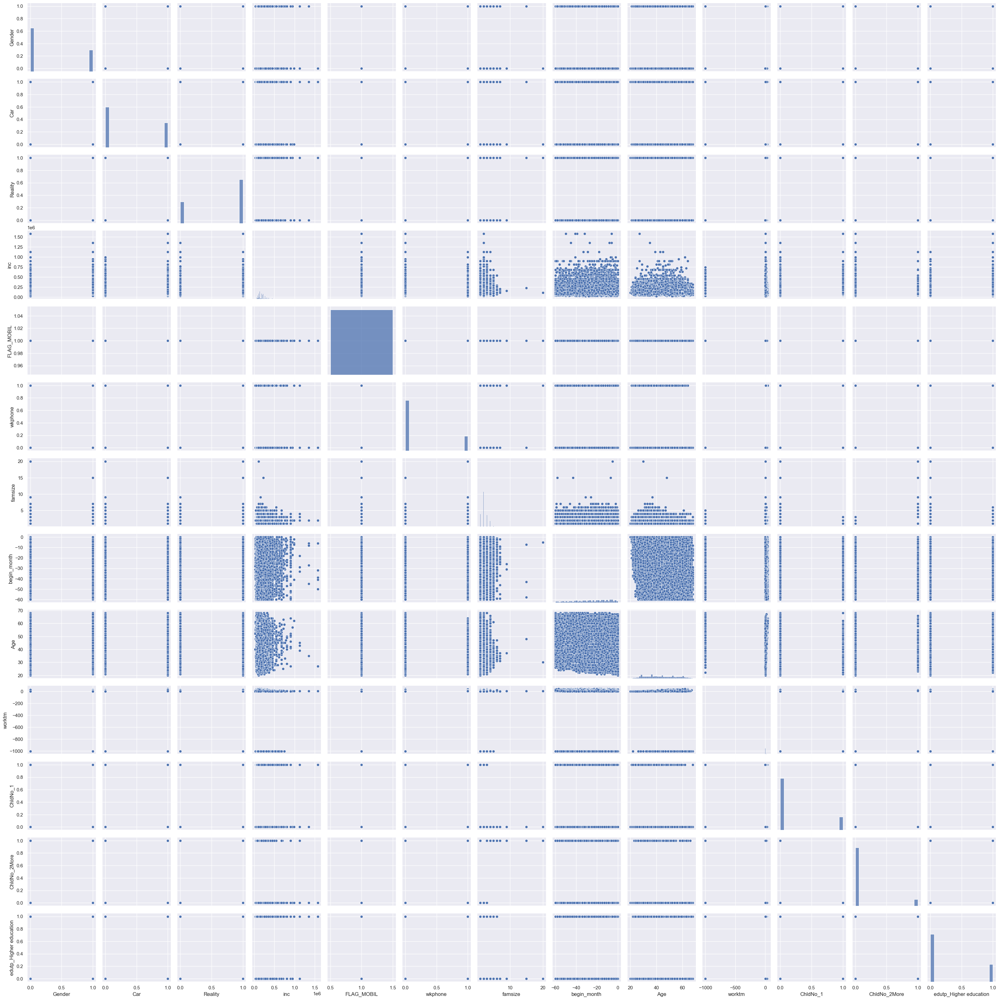

In [74]:
### Pairplot of all numerical features
pairplot_df = new_data[['Gender', 'Car', 'Reality', 'inc', 'FLAG_MOBIL', 'wkphone', 'famsize', 'begin_month', 'Age', 'worktm', 'ChldNo_1', 'ChldNo_2More', 'edutp_Higher education']].dropna()
sns.pairplot(pairplot_df)
plt.show()

### Distribution of target classes


<AxesSubplot: xlabel='target'>

Text(0.5, 0, 'target class')

Text(0, 0.5, '# of instances')

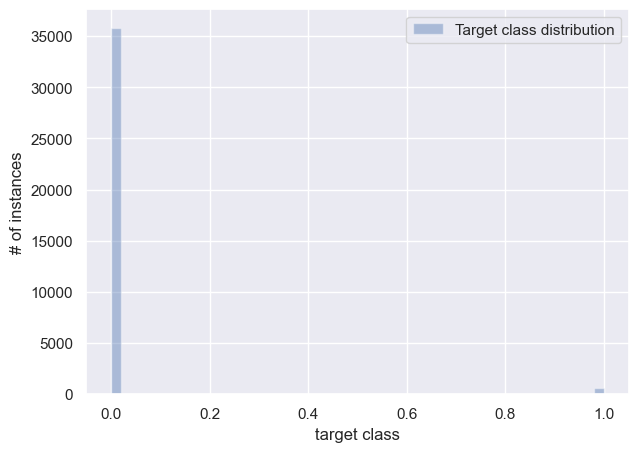

In [75]:
sns.distplot(new_data.target, label='Target class distribution', kde=False)
plt.xlabel('target class')
plt.ylabel('# of instances')
plt.legend()

In [76]:
target_stats = new_data.groupby('target')['ID'].agg(['min', 'max', 'mean'])
print(target_stats)

            min      max          mean
target                                
0       5008804  5150487  5.078141e+06
1       5008827  5150337  5.083206e+06


In [77]:
stat_period = pd.DataFrame(new_data.groupby(by='begin_month')[['target']].agg(['count','sum']))
stat_period.columns
stat_period['prc'] = stat_period[('target', 'sum')] / stat_period[('target', 'count')] *100


pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)



MultiIndex([('target', 'count'),
            ('target',   'sum')],
           )

In [78]:
stat_period.reset_index(inplace=True)

stat_period.columns

MultiIndex([('begin_month',      ''),
            (     'target', 'count'),
            (     'target',   'sum'),
            (        'prc',      '')],
           )

In [79]:
stat_period

begin_month target           prc
                count sum          
0        -60.0    321   9  2.803738
1        -59.0    307  11  3.583062
2        -58.0    333   8  2.402402
3        -57.0    304   6  1.973684
4        -56.0    345  16  4.637681
5        -55.0    368  18  4.891304
6        -54.0    358  11  3.072626
7        -53.0    377  14  3.713528
8        -52.0    463  12  2.591793
9        -51.0    476  12  2.521008
10       -50.0    447   7  1.565996
11       -49.0    431  10  2.320186
12       -48.0    459  16  3.485839
13       -47.0    481  15  3.118503
14       -46.0    447  11  2.460850
15       -45.0    457   8  1.750547
16       -44.0    447  11  2.460850
17       -43.0    521   9  1.727447
18       -42.0    540  16  2.962963
19       -41.0    552  15  2.717391
20       -40.0    590  18  3.050847
21       -39.0    675  15  2.222222
22       -38.0    591  11  1.861252
23       -37.0    548  17  3.102190
24       -36.0    533  14  2.626642
25       -35.0    584  11  1.883562
26       -34.0    586   9  1.535836
27       -33.0    560   9  1.607143
28       -32.0    574  10  1.742160
29       -31.0    597   8  1.340034
30       -30.0    617  11  1.782820
31       -29.0    623   9  1.444623
32       -28.0    639  11  1.721440
33       -27.0    682  13  1.906158
34       -26.0    620   6  0.967742
35       -25.0    694  16  2.305476
36       -24.0    703   5  0.711238
37       -23.0    696   7  1.005747
38       -22.0    669  11  1.644245
39       -21.0    650  13  2.000000
40       -20.0    710   8  1.126761
41       -19.0    673  13  1.931649
42       -18.0    706  11  1.558074
43       -17.0    807   7  0.867410
44       -16.0    785  11  1.401274
45       -15.0    774  10  1.291990
46       -14.0    774  10  1.291990
47       -13.0    773  10  1.293661
48       -12.0    771   7  0.907912
49       -11.0    828  12  1.449275
50       -10.0    798  13  1.629073
51        -9.0    770  14  1.818182
52        -8.0    820   8  0.975610
53        -7.0    889   7  0.787402
54        -6.0    824   5  0.606796
55        -5.0    816   6  0.735294
56        -4.0    765   3  0.392157
57        -3.0    800   1  0.125000
58        -2.0    643   1  0.155521
59        -1.0    551   0  0.000000
60         0.0    315   0  0.000000

<AxesSubplot: xlabel='begin_month', ylabel='prc'>

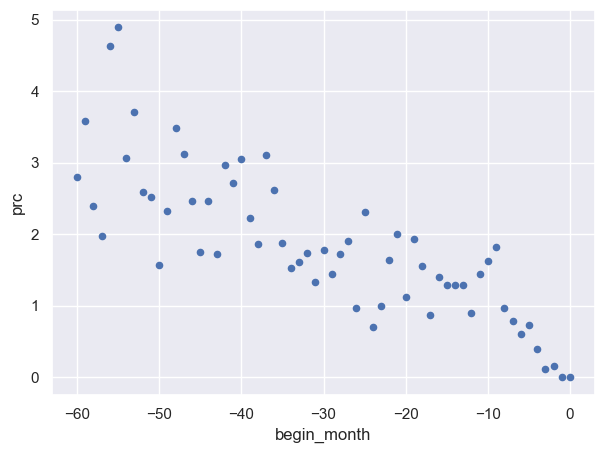

In [80]:
stat_period.plot(x='begin_month', y='prc', kind='scatter')
plt.show()

In [81]:
#Так как  заявки с датой старта менее 3 месяцев назад не могли выйти на прострочку 60+, то их нужно удалить с выборки
#Также старые заявки сильно отличаются по просрочке удалим их из выборки

In [82]:
new_data = new_data.drop(new_data[new_data['begin_month'] > -2].index)

In [83]:
new_data = new_data.drop(new_data[new_data['begin_month'] <-30].index)

# Modelling

In [84]:
Y = new_data['target']
X = new_data[['Gender','Reality','ChldNo_1', 'ChldNo_2More','wkphone',
      'occyp_hightecwk',   'occyp_officewk', 
       'houtp_Co-op apartment', 'houtp_Municipal apartment',
       'houtp_Office apartment', 'houtp_Rented apartment',
       'houtp_With parents','edutp_Higher education',
       'edutp_Incomplete higher', 'edutp_Lower secondary','famtp_Civil marriage',
       'famtp_Separated','famtp_Single / not married','famtp_Widow']]

In [85]:
Y = Y.astype('int')
X_balance, Y_balance = SMOTE().fit_resample(X, Y) #Using Synthetic Minority Over-Sampling Technique(SMOTE) to overcome sample imbalance problem.
X_balance = pd.DataFrame(X_balance, columns = X.columns)


In [86]:
X_balance.head()
Y_balance.value_counts()
Y.value_counts()

,Gender,Reality,ChldNo_1,ChldNo_2More,wkphone,occyp_hightecwk,occyp_officewk,houtp_Co-op apartment,houtp_Municipal apartment,houtp_Office apartment,houtp_Rented apartment,houtp_With parents,edutp_Higher education,edutp_Incomplete higher,edutp_Lower secondary,famtp_Civil marriage,famtp_Separated,famtp_Single / not married,famtp_Widow
0,1,1,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0
1,1,1,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,0
2,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0
4,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0


0    21060
1    21060
Name: target, dtype: int64

0    21060
1      259
Name: target, dtype: int64

In [87]:
X_train, X_test, y_train, y_test = train_test_split(X_balance,Y_balance, 
                                                    stratify=Y_balance, test_size=0.3,
                                                    random_state = 10086)

LogisticRegression(C=0.8, random_state=0)

Accuracy Score is 0.63145


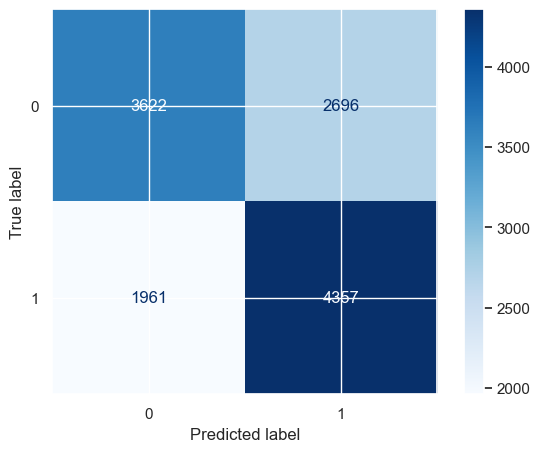

              precision    recall  f1-score   support

           0       0.65      0.57      0.61      6318
           1       0.62      0.69      0.65      6318

    accuracy                           0.63     12636
   macro avg       0.63      0.63      0.63     12636
weighted avg       0.63      0.63      0.63     12636



In [88]:
model = LogisticRegression(C=0.8,
                           random_state=0,
                           solver='lbfgs')
model.fit(X_train, y_train)
y_predict = model.predict(X_test)


print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

DecisionTreeClassifier(max_depth=12, min_samples_split=8, random_state=1024)

Accuracy Score is 0.71945


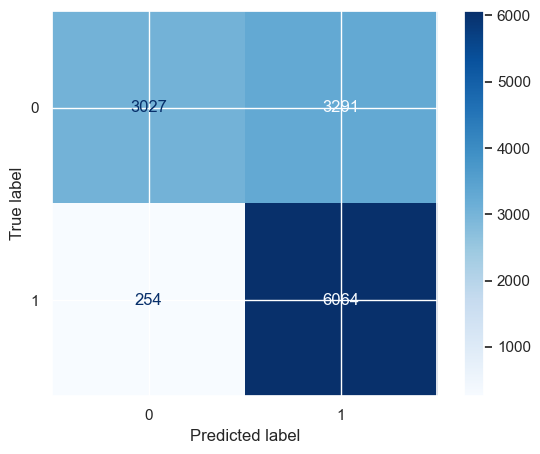

              precision    recall  f1-score   support

           0       0.92      0.48      0.63      6318
           1       0.65      0.96      0.77      6318

    accuracy                           0.72     12636
   macro avg       0.79      0.72      0.70     12636
weighted avg       0.79      0.72      0.70     12636



In [89]:
model = DecisionTreeClassifier(max_depth=12,
                               min_samples_split=8,
                               random_state=1024)
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

RandomForestClassifier(max_depth=12, min_samples_leaf=16, n_estimators=250)

Accuracy Score is 0.70901


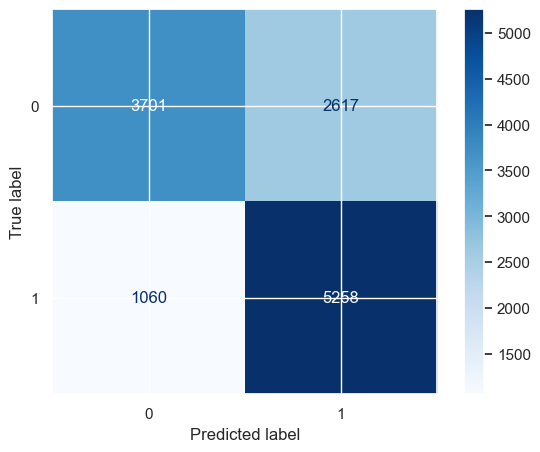

              precision    recall  f1-score   support

           0       0.78      0.59      0.67      6318
           1       0.67      0.83      0.74      6318

    accuracy                           0.71     12636
   macro avg       0.72      0.71      0.70     12636
weighted avg       0.72      0.71      0.70     12636



In [90]:
model = RandomForestClassifier(n_estimators=250,
                              max_depth=12,
                              min_samples_leaf=16
                              )
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

In [91]:
classifiers = []
accuracy_train = []
accuracy_test = []
mae_train = []
mae_test = []
estimators = []
n_estimators_max = 50

for n_esimators in range(2, n_estimators_max):
    
    rf = RandomForestClassifier(random_state=13)
    rf.n_estimators = n_esimators
    rf.fit(X_train, y_train)
    y_predict = rf.predict(X_test)
    
    classifiers.append(rf)
    
    accuracy_test.append(accuracy_score(y_test, y_predict))
    mae_test.append(mean_absolute_error(y_test, y_predict))
    
    accuracy_train.append(accuracy_score(rf.predict(X_train),  y_train))
    mae_train.append(mean_absolute_error(rf.predict(X_train),  y_train))
    
    estimators.append(rf.n_estimators)

RandomForestClassifier(n_estimators=2, random_state=13)

RandomForestClassifier(n_estimators=3, random_state=13)

RandomForestClassifier(n_estimators=4, random_state=13)

RandomForestClassifier(n_estimators=5, random_state=13)

RandomForestClassifier(n_estimators=6, random_state=13)

RandomForestClassifier(n_estimators=7, random_state=13)

RandomForestClassifier(n_estimators=8, random_state=13)

RandomForestClassifier(n_estimators=9, random_state=13)

RandomForestClassifier(n_estimators=10, random_state=13)

RandomForestClassifier(n_estimators=11, random_state=13)

RandomForestClassifier(n_estimators=12, random_state=13)

RandomForestClassifier(n_estimators=13, random_state=13)

RandomForestClassifier(n_estimators=14, random_state=13)

RandomForestClassifier(n_estimators=15, random_state=13)

RandomForestClassifier(n_estimators=16, random_state=13)

RandomForestClassifier(n_estimators=17, random_state=13)

RandomForestClassifier(n_estimators=18, random_state=13)

RandomForestClassifier(n_estimators=19, random_state=13)

RandomForestClassifier(n_estimators=20, random_state=13)

RandomForestClassifier(n_estimators=21, random_state=13)

RandomForestClassifier(n_estimators=22, random_state=13)

RandomForestClassifier(n_estimators=23, random_state=13)

RandomForestClassifier(n_estimators=24, random_state=13)

RandomForestClassifier(n_estimators=25, random_state=13)

RandomForestClassifier(n_estimators=26, random_state=13)

RandomForestClassifier(n_estimators=27, random_state=13)

RandomForestClassifier(n_estimators=28, random_state=13)

RandomForestClassifier(n_estimators=29, random_state=13)

RandomForestClassifier(n_estimators=30, random_state=13)

RandomForestClassifier(n_estimators=31, random_state=13)

RandomForestClassifier(n_estimators=32, random_state=13)

RandomForestClassifier(n_estimators=33, random_state=13)

RandomForestClassifier(n_estimators=34, random_state=13)

RandomForestClassifier(n_estimators=35, random_state=13)

RandomForestClassifier(n_estimators=36, random_state=13)

RandomForestClassifier(n_estimators=37, random_state=13)

RandomForestClassifier(n_estimators=38, random_state=13)

RandomForestClassifier(n_estimators=39, random_state=13)

RandomForestClassifier(n_estimators=40, random_state=13)

RandomForestClassifier(n_estimators=41, random_state=13)

RandomForestClassifier(n_estimators=42, random_state=13)

RandomForestClassifier(n_estimators=43, random_state=13)

RandomForestClassifier(n_estimators=44, random_state=13)

RandomForestClassifier(n_estimators=45, random_state=13)

RandomForestClassifier(n_estimators=46, random_state=13)

RandomForestClassifier(n_estimators=47, random_state=13)

RandomForestClassifier(n_estimators=48, random_state=13)

RandomForestClassifier(n_estimators=49, random_state=13)

Text(0.5, 0, 'Number of estimators')

Text(0, 0.5, 'accuracy')

Text(0.5, 0, 'Number of estimators')

Text(0, 0.5, 'mean absolute error')

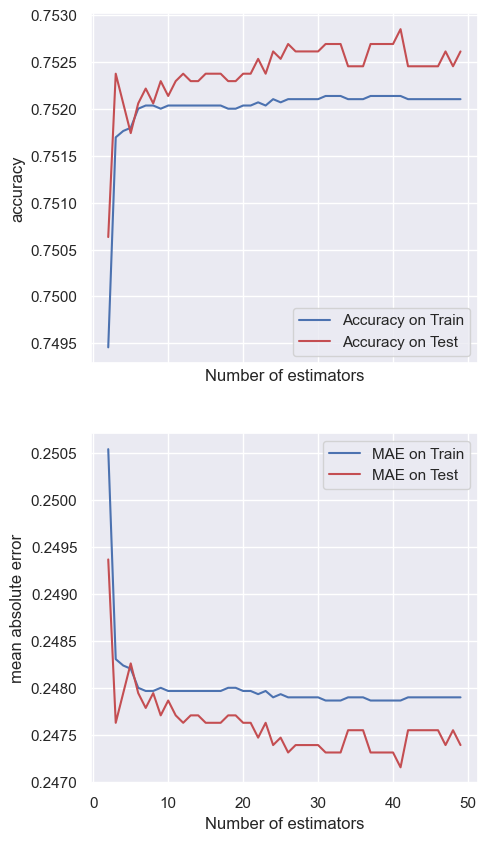

In [92]:
fig, ax = plt.subplots(nrows=2, ncols=1, sharex=True, figsize=(5, 10))

ax[0].plot(estimators, accuracy_train, '-b', label='Accuracy on Train')
ax[0].plot(estimators, accuracy_test, '-r', label='Accuracy on Test')
ax[0].grid()
ax[0].set_xlabel('Number of estimators')
ax[0].set_ylabel('accuracy')
ax[0].legend()
ax[0].grid()

ax[1].plot(estimators, mae_train, '-b', label='MAE on Train')
ax[1].plot(estimators, mae_test, '-r', label='MAE on Test')
ax[1].grid()
ax[1].set_xlabel('Number of estimators')
ax[1].set_ylabel('mean absolute error')
ax[1].legend()
ax[1].grid()

SVC(C=0.8, kernel='linear')

Accuracy Score is 0.63826


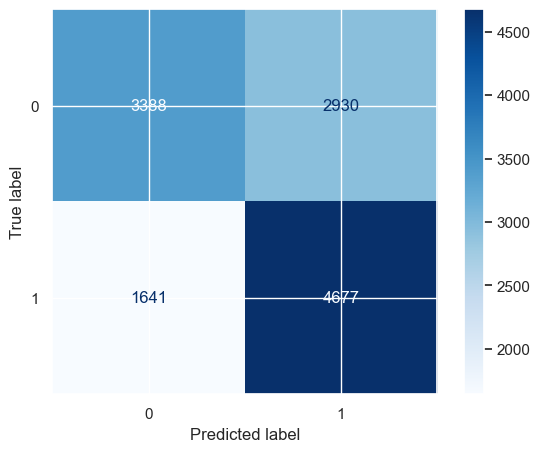

              precision    recall  f1-score   support

           0       0.67      0.54      0.60      6318
           1       0.61      0.74      0.67      6318

    accuracy                           0.64     12636
   macro avg       0.64      0.64      0.63     12636
weighted avg       0.64      0.64      0.63     12636



In [93]:
model = svm.SVC(C = 0.8,
                kernel='linear')
model.fit(X_train, y_train)
y_predict = model.predict(X_test)

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.02, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=12, max_leaves=None,
              min_child_weight=8, missing=nan, monotone_constraints=None,
              n_estimators=250, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

Accuracy Score is 0.74968


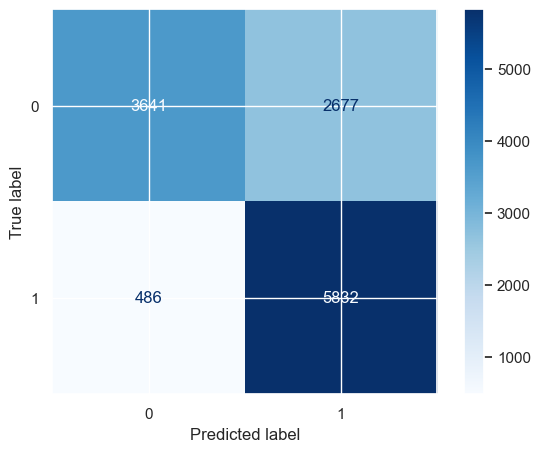

              precision    recall  f1-score   support

           0       0.88      0.58      0.70      6318
           1       0.69      0.92      0.79      6318

    accuracy                           0.75     12636
   macro avg       0.78      0.75      0.74     12636
weighted avg       0.78      0.75      0.74     12636



In [94]:
model = XGBClassifier(max_depth=12,
                      n_estimators=250,
                      min_child_weight=8, 
                      subsample=0.8, 
                      learning_rate =0.02,    
                      seed=42)

model.fit(X_train, y_train)
y_predict = model.predict(X_test)
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

0:	learn: 0.6463573	total: 870ms	remaining: 42.6s
25:	learn: 0.4886689	total: 9.53s	remaining: 8.8s
49:	learn: 0.4778098	total: 13.7s	remaining: 0us


CatBoost Accuracy Score is 0.75245


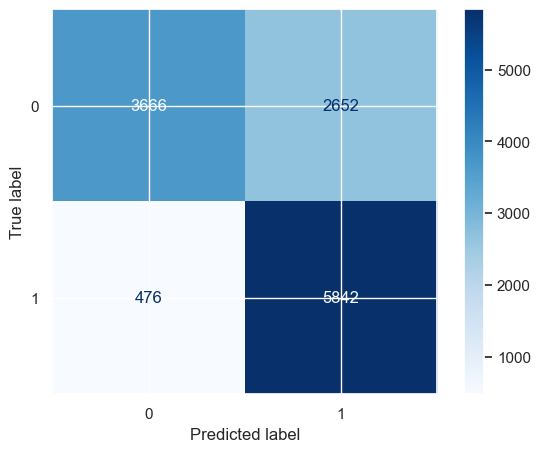

              precision    recall  f1-score   support

           0       0.89      0.58      0.70      6318
           1       0.69      0.92      0.79      6318

    accuracy                           0.75     12636
   macro avg       0.79      0.75      0.74     12636
weighted avg       0.79      0.75      0.74     12636



In [95]:
model = CatBoostClassifier(iterations=50,
                           learning_rate=0.2,
                           od_type='Iter',
                           verbose=25,
                           depth=16,
                           random_seed=42)

model.fit(X_train, y_train)
y_predict = model.predict(X_test)
print('CatBoost Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

# Modelling with PCA - Principal Component Analysis

# Visualization with 2 components (PCA)

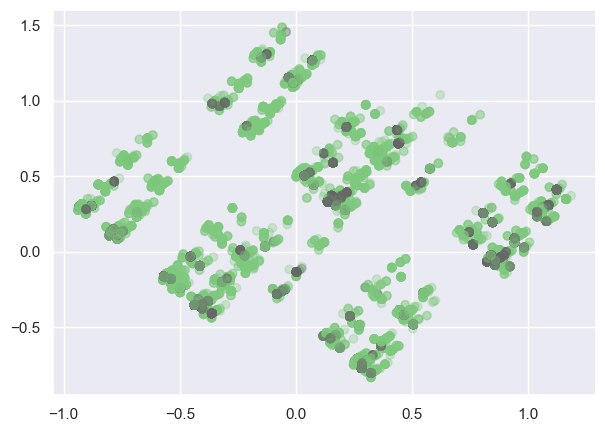

In [96]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_train[:])

plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y_train, alpha=0.3, cmap='Accent')

# ### Visualization with 3 components (PCA)

In [97]:
pca = PCA(n_components=3)
X_pca3d = pca.fit_transform(X_train[:])


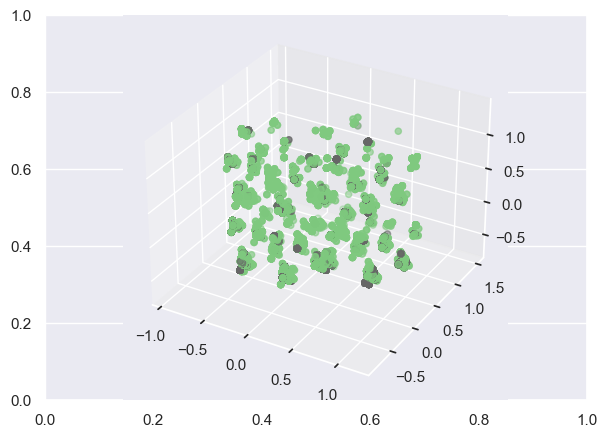

In [98]:
# %matplotlib notebook
fig, ax = plt.subplots()
ax = plt.axes(projection='3d')
ax.scatter3D(X_pca3d[:, 0], X_pca3d[:, 1], X_pca3d[:, 2], c=y_train, cmap='Accent')

Как видно из визуализаций PCA различить границы между целевыми классами нельзя, но у нас есть "облака" где нет плохого класса. Итак, похоже, что производительность моделей классификации упадет не очень сильно если снизить размерность данных, но мой класс задач не терпит падения точности и лучше обучаться дольше, чем потерять качество.

Беру лучшую модель с предыдущего шага, немного уменьшаю глубинуи с ней сравниваю результаты с и без PCA

0:	learn: 0.6549540	total: 11.4ms	remaining: 556ms
25:	learn: 0.5085368	total: 256ms	remaining: 236ms
49:	learn: 0.4870271	total: 468ms	remaining: 0us


CatBoost Accuracy Score is 0.75206


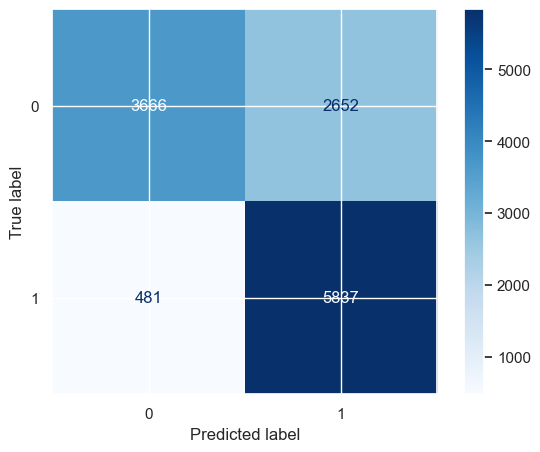

              precision    recall  f1-score   support

           0       0.88      0.58      0.70      6318
           1       0.69      0.92      0.79      6318

    accuracy                           0.75     12636
   macro avg       0.79      0.75      0.74     12636
weighted avg       0.79      0.75      0.74     12636

--- 0.6049098968505859 seconds ---


In [99]:
start_time = time.time()


model = CatBoostClassifier(iterations=50,
                           learning_rate=0.2,
                           od_type='Iter',
                           verbose=25,
                           depth=10,
                           random_seed=42)

model.fit(X_train, y_train)
y_predict = model.predict(X_test)
print('CatBoost Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# Compute the confusion matrix
cm = confusion_matrix(y_test, y_predict)
# Plot confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=matplotlib.colormaps["Blues"])
plt.show()
#plt.savefig("confusion_matrix.png")

# Print classification report
report = classification_report(y_test, y_predict)
print(report)

print("--- %s seconds ---" % (time.time() - start_time))


Применяю метод главных компонент

In [100]:
# Use PCA to reduce the dimensionality of the dataset
pca = PCA()
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)

Text(0.5, 0, 'Number of components')

Text(0, 0.5, 'Explained variance')

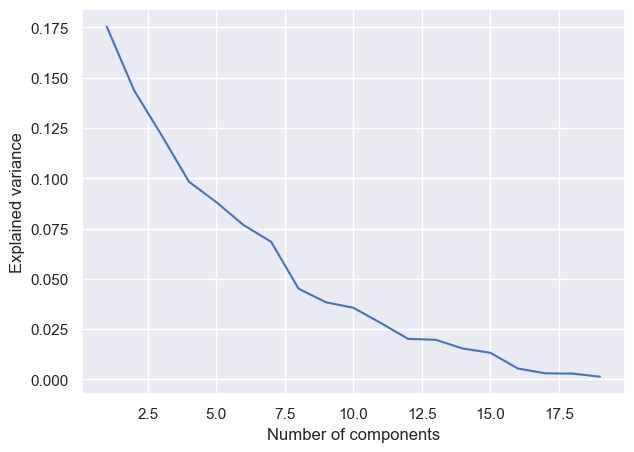

In [101]:
# Plot the explained variance to determine the appropriate number of components to use
 
plt.plot(range(1, len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

In [102]:
cumsum = np.cumsum(pca.explained_variance_ratio_)

<Figure size 800x800 with 0 Axes>

Text(0.5, 0, 'Number of components')

Text(0, 0.5, 'cummulative Explained variance')

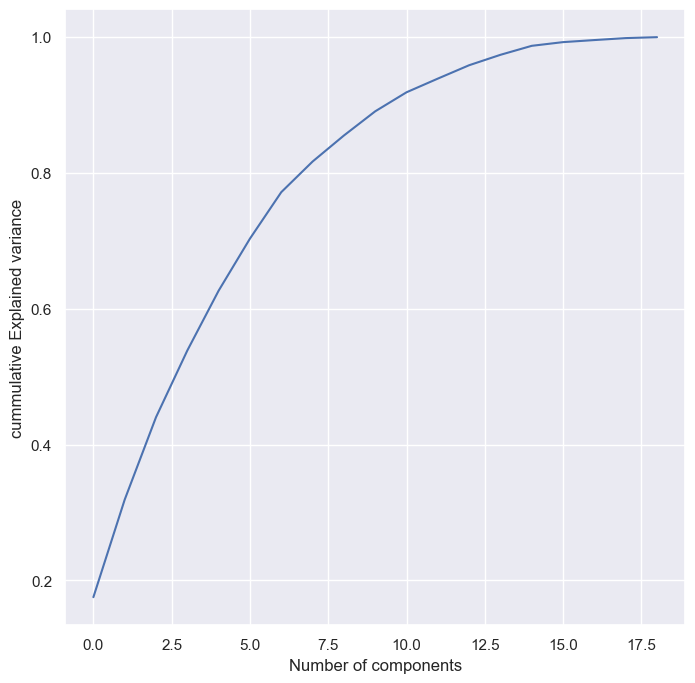

In [103]:
plt.figure(figsize=(8,8))
plt.xlabel('Number of components')
plt.ylabel('cummulative Explained variance')
plt.plot(cumsum)

In [104]:
X_train.shape
X_train_reduced.shape

(29484, 19)

(29484, 19)

Для моей задачи потеря в точности - это критично, поэтому я выберу 16 компонент чтобы все описать
Но до этого эксперимента ради почсотрю что будет с точностью и скоростью если выбираем описать 88% дисперсии

In [105]:
pca = PCA(n_components=10)
X_train_reduced = pca.fit_transform(X_train[:])
X_test_reduced  = pca.transform(X_test)


start_time = time.time()


# Retrain the same model on the reduced dataset
model_reduced = CatBoostClassifier(iterations=50,
                                    learning_rate=0.2,
                                    od_type='Iter',
                                    verbose=25,
                                    depth=10,
                                    random_seed=42)

model_reduced.fit(X_train_reduced, y_train)
y_predict_reduced = model_reduced.predict(X_test_reduced)

print('CatBoost Accuracy Score with reduced dimensionality is {:.5}'.format(accuracy_score(y_test, y_predict_reduced)))
print("--- %s seconds ---" % (time.time() - start_time))

0:	learn: 0.6521222	total: 9.63ms	remaining: 472ms
25:	learn: 0.4990683	total: 245ms	remaining: 226ms
49:	learn: 0.4846230	total: 468ms	remaining: 0us


CatBoost Accuracy Score with reduced dimensionality is 0.75016
--- 0.5737700462341309 seconds ---


In [106]:
pca = PCA(n_components=6)
X_train_reduced = pca.fit_transform(X_train[:])
X_test_reduced  = pca.transform(X_test)


start_time = time.time()


# Retrain the same model on the reduced dataset
model_reduced = CatBoostClassifier(iterations=50,
                                    learning_rate=0.2,
                                    od_type='Iter',
                                    verbose=25,
                                    depth=10,
                                    random_seed=42)

model_reduced.fit(X_train_reduced, y_train)
y_predict_reduced = model_reduced.predict(X_test_reduced)

print('CatBoost Accuracy Score with reduced dimensionality is {:.5}'.format(accuracy_score(y_test, y_predict_reduced)))
print("--- %s seconds ---" % (time.time() - start_time))

0:	learn: 0.6595819	total: 7.42ms	remaining: 364ms
25:	learn: 0.5202749	total: 210ms	remaining: 194ms
49:	learn: 0.5005154	total: 388ms	remaining: 0us


CatBoost Accuracy Score with reduced dimensionality is 0.74755
--- 0.4618508815765381 seconds ---


In [107]:
accuracy_list = []
time_list = []

for n in range(2, 18):
    pca = PCA(n_components=n)
    X_train_reduced = pca.fit_transform(X_train)
    X_test_reduced = pca.transform(X_test)

    start_time = time.time()
    model_reduced = CatBoostClassifier(iterations=50, learning_rate=0.2, od_type='Iter', verbose=25, depth=10, random_seed=42)
    model_reduced.fit(X_train_reduced, y_train)
    y_predict_reduced = model_reduced.predict(X_test_reduced)

    accuracy = accuracy_score(y_test, y_predict_reduced)
    accuracy_list.append(accuracy)
    time_list.append(time.time() - start_time)
    
    print(f"n_components: {n}, Accuracy: {accuracy:.5}, Time: {time_list[-1]:.5}")


0:	learn: 0.6716884	total: 4.81ms	remaining: 236ms
25:	learn: 0.5585548	total: 134ms	remaining: 124ms
49:	learn: 0.5288723	total: 254ms	remaining: 0us


n_components: 2, Accuracy: 0.72483, Time: 0.29713
0:	learn: 0.6691828	total: 5.78ms	remaining: 283ms
25:	learn: 0.5437428	total: 148ms	remaining: 137ms
49:	learn: 0.5172213	total: 284ms	remaining: 0us


n_components: 3, Accuracy: 0.73797, Time: 0.33497
0:	learn: 0.6638274	total: 5.89ms	remaining: 289ms
25:	learn: 0.5304719	total: 170ms	remaining: 156ms
49:	learn: 0.5061510	total: 314ms	remaining: 0us


n_components: 4, Accuracy: 0.74422, Time: 0.37219
0:	learn: 0.6620636	total: 6.91ms	remaining: 339ms
25:	learn: 0.5218754	total: 190ms	remaining: 176ms
49:	learn: 0.5022672	total: 360ms	remaining: 0us


n_components: 5, Accuracy: 0.74549, Time: 0.42567
0:	learn: 0.6595819	total: 7.66ms	remaining: 376ms
25:	learn: 0.5202749	total: 202ms	remaining: 187ms
49:	learn: 0.5005154	total: 381ms	remaining: 0us


n_components: 6, Accuracy: 0.74755, Time: 0.45401
0:	learn: 0.6560845	total: 8.49ms	remaining: 416ms
25:	learn: 0.5181008	total: 211ms	remaining: 195ms
49:	learn: 0.4971307	total: 400ms	remaining: 0us


n_components: 7, Accuracy: 0.7466, Time: 0.48253
0:	learn: 0.6526942	total: 8.46ms	remaining: 414ms
25:	learn: 0.5128309	total: 219ms	remaining: 203ms
49:	learn: 0.4941840	total: 426ms	remaining: 0us


n_components: 8, Accuracy: 0.74652, Time: 0.51506
0:	learn: 0.6556057	total: 8.75ms	remaining: 429ms
25:	learn: 0.5088679	total: 240ms	remaining: 222ms
49:	learn: 0.4917208	total: 467ms	remaining: 0us


n_components: 9, Accuracy: 0.74707, Time: 0.56217
0:	learn: 0.6521222	total: 9.68ms	remaining: 474ms
25:	learn: 0.4990683	total: 247ms	remaining: 228ms
49:	learn: 0.4846230	total: 467ms	remaining: 0us


n_components: 10, Accuracy: 0.75016, Time: 0.5749
0:	learn: 0.6509675	total: 10.1ms	remaining: 497ms
25:	learn: 0.4965533	total: 261ms	remaining: 241ms
49:	learn: 0.4823237	total: 489ms	remaining: 0us


n_components: 11, Accuracy: 0.74953, Time: 0.60107
0:	learn: 0.6521798	total: 10.7ms	remaining: 527ms
25:	learn: 0.4883086	total: 272ms	remaining: 251ms
49:	learn: 0.4778300	total: 502ms	remaining: 0us


n_components: 12, Accuracy: 0.75016, Time: 0.62264
0:	learn: 0.6502395	total: 10.5ms	remaining: 517ms
25:	learn: 0.4864910	total: 271ms	remaining: 250ms
49:	learn: 0.4764376	total: 510ms	remaining: 0us


n_components: 13, Accuracy: 0.75024, Time: 0.63837
0:	learn: 0.6515430	total: 11.6ms	remaining: 569ms
25:	learn: 0.4858681	total: 284ms	remaining: 262ms
49:	learn: 0.4756605	total: 533ms	remaining: 0us


n_components: 14, Accuracy: 0.75095, Time: 0.67006
0:	learn: 0.6496274	total: 11ms	remaining: 538ms
25:	learn: 0.4843297	total: 288ms	remaining: 265ms
49:	learn: 0.4747611	total: 543ms	remaining: 0us


n_components: 15, Accuracy: 0.75135, Time: 0.68771
0:	learn: 0.6497485	total: 11.7ms	remaining: 572ms
25:	learn: 0.4828026	total: 307ms	remaining: 283ms
49:	learn: 0.4730463	total: 580ms	remaining: 0us


n_components: 16, Accuracy: 0.75222, Time: 0.641
0:	learn: 0.6484030	total: 12.2ms	remaining: 599ms
25:	learn: 0.4824639	total: 315ms	remaining: 290ms
49:	learn: 0.4726572	total: 597ms	remaining: 0us


n_components: 17, Accuracy: 0.75222, Time: 0.66113


Text(0.5, 0, 'n_components')

Text(0, 0.5, 'Accuracy')

Text(0.5, 1.0, 'Accuracy vs n_components')

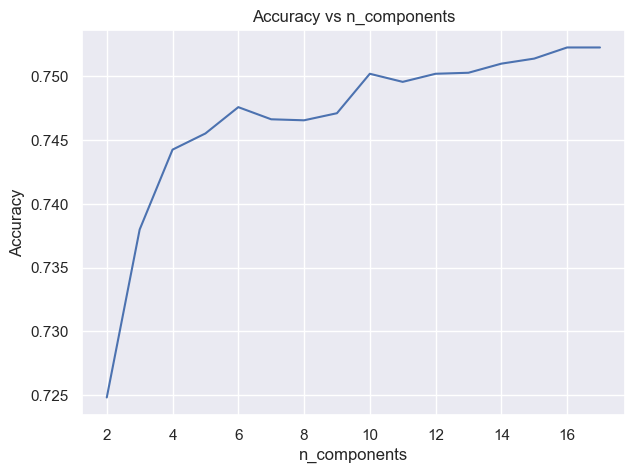

Text(0.5, 0, 'n_components')

Text(0, 0.5, 'Time (s)')

Text(0.5, 1.0, 'Time vs n_components')

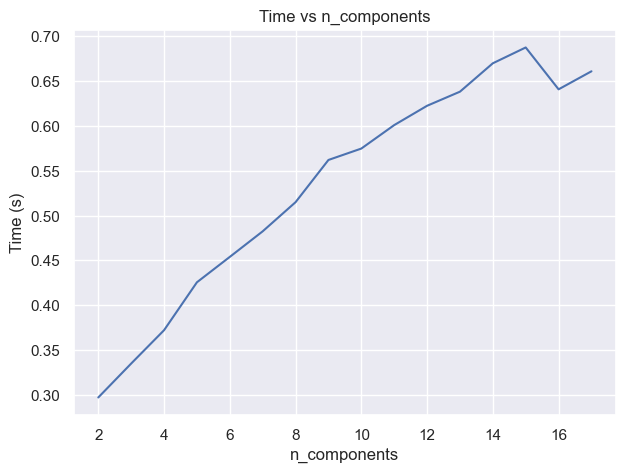

In [108]:
# График Accuracy
plt.plot(range(2, 18), accuracy_list)
plt.xlabel('n_components')
plt.ylabel('Accuracy')
plt.title('Accuracy vs n_components')
plt.show()

# График времени обучения
plt.plot(range(2, 18), time_list)
plt.xlabel('n_components')
plt.ylabel('Time (s)')
plt.title('Time vs n_components')
plt.show()

# Строю итоговую модель

In [109]:
pca = PCA(n_components=16)
X_train_reduced = pca.fit_transform(X_train[:])
X_test_reduced  = pca.transform(X_test)

In [110]:
start_time = time.time()


# Retrain the same model on the reduced dataset
model_reduced = CatBoostClassifier(iterations=50,
                                    learning_rate=0.2,
                                    od_type='Iter',
                                    verbose=25,
                                    depth=10,
                                    random_seed=42)

model_reduced.fit(X_train_reduced, y_train)
y_predict_reduced = model_reduced.predict(X_test_reduced)

print('CatBoost Accuracy Score with reduced dimensionality is {:.5}'.format(accuracy_score(y_test, y_predict_reduced)))
print("--- %s seconds ---" % (time.time() - start_time))

0:	learn: 0.6497485	total: 12.1ms	remaining: 595ms
25:	learn: 0.4828026	total: 306ms	remaining: 282ms
49:	learn: 0.4730463	total: 567ms	remaining: 0us


CatBoost Accuracy Score with reduced dimensionality is 0.75222
--- 0.6283318996429443 seconds ---


In [111]:
## decile

In [112]:
 def plot_deciles(decile_stat):
    fig = plt.figure(figsize=(15, 10))
    axis = fig.add_subplot(111)
    axis.bar(
        decile_stat.index,
        decile_stat['y_true_count'],
        0.9, color='#00FF7F'
    )
    axis.bar(
        decile_stat.index,
        decile_stat['y_true_sum'],
        0.9, color='#CD5C5C',
     #   bottom=decile_stat['y_true_count']
    )
    axis_2 = fig.add_subplot(111, sharex=axis, frameon=False)
    axis_2.plot(
        decile_stat.index,
        decile_stat['y_true_mean'],
        marker='o'
    )
    axis_2.yaxis.tick_right()
    axis_2.yaxis.set_label_position("right")
    
    for index, data in enumerate(decile_stat['y_true_mean']):
        plt.text(x=index , y=data, s=f"{data}%" , fontdict=dict(fontsize=10))
    
    plt.xticks(decile_stat.index)
    axis.legend(('Всего ', 'Просрочка 60+'), loc="upper left")
    return plt

In [119]:
pred = model_reduced.predict_proba(X_train)[:,1]

best_class = 0
best_class_proba = 0.0

best_class = np.round(pred).astype(int)
best_class_proba = pred
_tmp_df = pd.DataFrame(
        {'y_true': y_train, 'y_pred': best_class_proba,
         'y_pred_class': best_class})

_tmp_df['res'] = _tmp_df['y_true']==_tmp_df['y_pred_class']

ser, bins = pd.qcut(_tmp_df['y_pred'], q=10, retbins=True, labels=False, duplicates='drop')

decile = pd.DataFrame({'lower_boundary': bins})
decile['upper_boundary'] = decile['lower_boundary'].shift(-1)
decile.loc[:0, 'lower_boundary'] = 0
decile.loc[9:9, 'upper_boundary'] = 1
decile['lower_boundary'] = decile['lower_boundary'] + 0.000001
decile.index = decile.index + 1
decile = decile.iloc[0:10]
decile['decile'] = decile.index
decile

,lower_boundary,upper_boundary,decile
1,0.000001,0.092331,1
2,0.092332,0.119588,2
3,0.119589,0.133624,3
4,0.133625,0.157240,4
5,0.157241,0.180894,5
6,0.180895,0.208092,6
7,0.208093,0.289539,7
8,0.289540,0.313799,8
9,0.313800,0.438544,9
10,0.438545,1.000000,10


,y_true_count,y_true_sum,y_true_mean
decile,,,
1,4081,2099,51.43
2,1893,521,27.52
3,2908,1265,43.50
4,6796,3496,51.44
5,2142,955,44.58
6,4468,2553,57.14
7,2929,1306,44.59
8,1677,824,49.14
9,2590,1723,66.53


<module 'matplotlib.pyplot' from '/Users/marinalysenko/anaconda3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

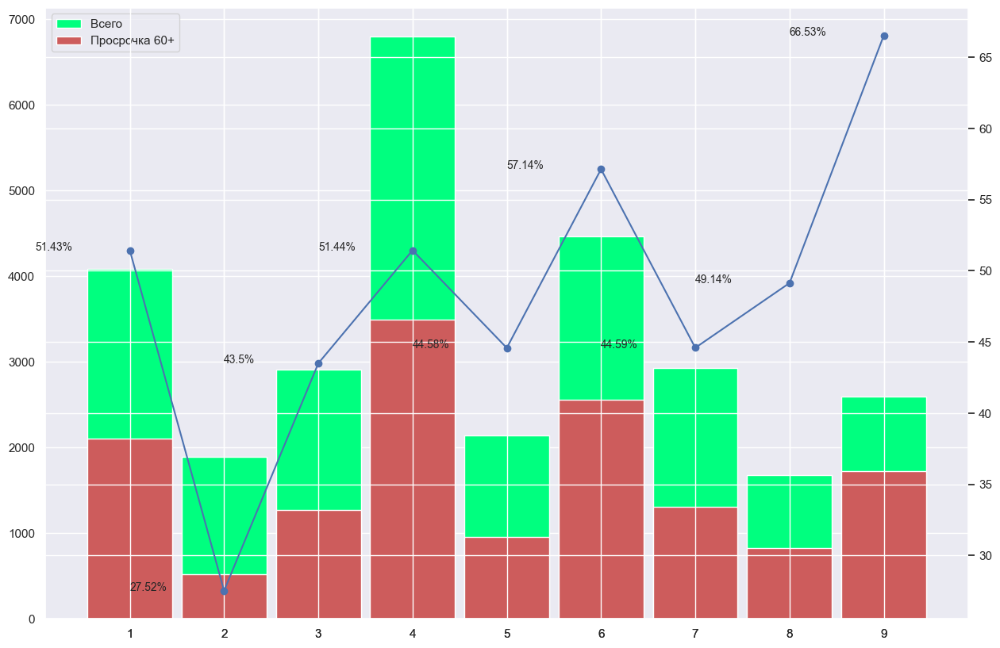

In [120]:
_tmp_df['decile'] = pd.cut(_tmp_df['y_pred'], bins=bins, labels=False, include_lowest=True, duplicates='drop') + 1
_tmp_df2 = _tmp_df.groupby(['decile']).agg(dict(y_true=['count', 'sum','mean']))
_tmp_df2.columns = ['_'.join(c) for c in _tmp_df2]
_tmp_df2['y_true_mean'] = (100 * _tmp_df2['y_true_mean']).apply(lambda x: round(x, 2))
_tmp_df2
plot_deciles(_tmp_df2)

In [121]:
_tmp_df2

,y_true_count,y_true_sum,y_true_mean
decile,,,
1,4081,2099,51.43
2,1893,521,27.52
3,2908,1265,43.50
4,6796,3496,51.44
5,2142,955,44.58
6,4468,2553,57.14
7,2929,1306,44.59
8,1677,824,49.14
9,2590,1723,66.53


y_true               
        count  sum      mean
decile                      
1.0      1101    3  0.002725
2.0       449   11  0.024499
3.0       203    1  0.004926
4.0        98    2  0.020408
5.0       129    9  0.069767
6.0        47    1  0.021277
7.0       362   59  0.162983
8.0       186   60  0.322581
9.0       647  230  0.355487

,y_true_count,y_true_sum,y_true_mean
decile,,,
1.0,1101,3,0.27
2.0,449,11,2.45
3.0,203,1,0.49
4.0,98,2,2.04
5.0,129,9,6.98
6.0,47,1,2.13
7.0,362,59,16.30
8.0,186,60,32.26
9.0,647,230,35.55


<module 'matplotlib.pyplot' from '/Users/marinalysenko/anaconda3/lib/python3.10/site-packages/matplotlib/pyplot.py'>

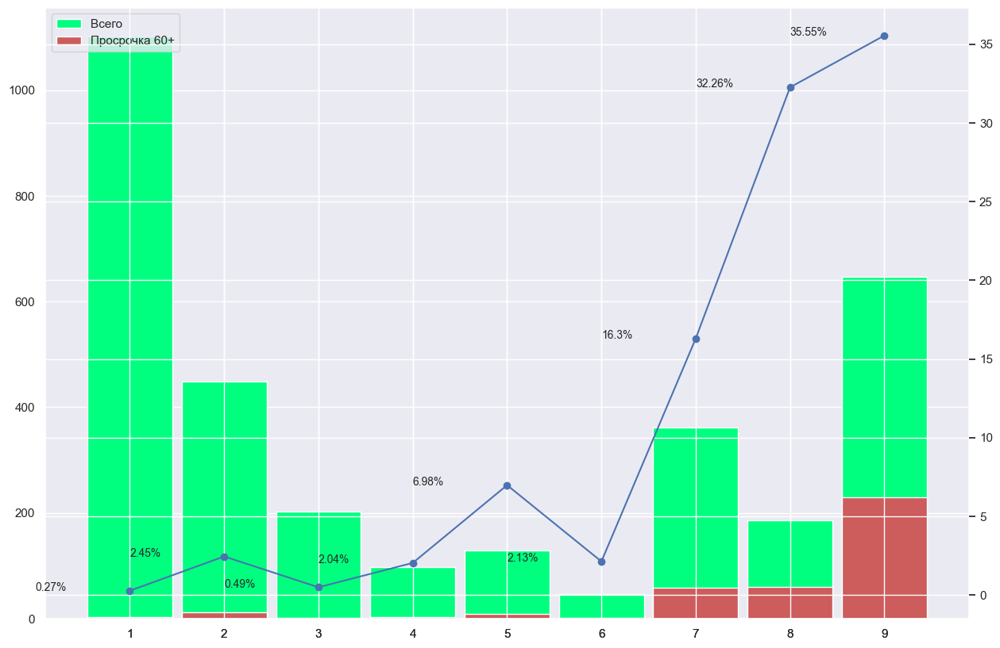

In [122]:
pred = model.predict_proba(X_test)[:,1]
best_class = 0
best_class_proba = 0.0

best_class = np.round(pred).astype(int)
best_class_proba = pred
_tmp_df = pd.DataFrame(
        {
#             'id':X_test_id,
         'y_true': y_test, 'y_pred': best_class_proba,
         'y_pred_class': best_class})


_tmp_df['decile'] = pd.cut(_tmp_df['y_pred'], bins=bins, labels=False, include_lowest=True, duplicates='drop') + 1
_tmp_df.groupby(['decile']).agg(dict(y_true=['count', 'sum','mean']))
_tmp_df2 = _tmp_df.groupby(['decile']).agg(dict(y_true=['count', 'sum','mean']))
_tmp_df2.columns = ['_'.join(c) for c in _tmp_df2]
_tmp_df2['y_true_mean'] = (100 * _tmp_df2['y_true_mean']).apply(lambda x: round(x, 2))
_tmp_df2



plot_deciles(_tmp_df2)

In [117]:
_tmp_df2

,y_true_count,y_true_sum,y_true_mean
decile,,,
1.0,1851,17,0.92
2.0,1371,359,26.19


Модель работает не стабильно,судя по скачку проблемности в первом дециле трейн выборки
Модель имеет положительное смещение в сторону хорошего дециля (на выборке тест первый дециль не имеет столь высокой проблемности)
Распределение заявок на тестовой выборке не соответствует распределению на обучающей имея более сильный перекос в сторону первого дециля
Модель имеет тенденцию роста проблемности с ростом дециля и неплохо разделяет заявки
Очень большое отличие проблемностей в децилях по трейн и тест (при этом выборки разделялись случайно, а не по временному срезу, причина такой особенности не понятна)

In [118]:
# Сохраним подготовленный датасет в файл csv для дальнейшего использования в лабораторных
new_data.to_csv('creditlimitdata.csv', index=False)